In [ ]:
!pip install kneed==0.8.6 gdown==5.2.1

**setup**

In [2]:
from johnsnowlabs import *

import json
import os
import pyspark
import sparkocr
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

spark = start_spark()
print("Spark OCR Version :", sparkocr.version())

📋 Loading license number 0 from /home/ubuntu/.johnsnowlabs/licenses/license_number_{number}_for_Spark-Healthcare.json


26/03/30 11:57:57 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


👌 Launched cpu optimized session with with: 🚀Spark-NLP==6.3.2, 💊Spark-Healthcare==6.3.0, 🕶Spark-OCR==6.3.0, running on ⚡ PySpark==3.4.0
Spark OCR Version : 6.3.0


## Define pipeline for compute features

In [3]:
import pyspark
import json
import os
import pandas as pd
from pyspark.sql import SparkSession
import pyspark.sql.functions as f
from sparkocr.transformers import *
from sparkocr.utils import *
from sparkocr.enums import *
from pyspark.ml import PipelineModel, Pipeline
from pyspark.ml.feature import PCA, StandardScaler
from pyspark.ml.clustering import KMeans
from kneed import KneeLocator

In [4]:
binary_to_image = BinaryToImage() \
    .setInputCol("content") \
    .setOutputCol("image")

embeddings = VitImageEmbeddings \
    .pretrained("vit_image_embeddings", "en", "clinical/ocr") \
    .setInputCol("image") \
    .setOutputCol("embeddings")

scaler = StandardScaler() \
    .setInputCol("embeddings") \
    .setOutputCol("scaled_embeddings")

pca = PCA() \
    .setInputCol("scaled_embeddings") \
    .setOutputCol("pcaFeatures") \
    .setK(100)

pipeline = Pipeline(stages=[
     binary_to_image,
     embeddings,
     scaler,
     pca
])

vit_image_embeddings download started this may take some time.
Approximate size to download 303.6 MB
vit_image_embeddings download started this may take some time.
Approximate size to download 303.6 MB


26/03/30 11:58:20 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.
26/03/30 11:58:20 WARN S3AbortableInputStream: Not all bytes were read from the S3ObjectInputStream, aborting HTTP connection. This is likely an error and may result in sub-optimal behavior. Request only the bytes you need via a ranged GET or drain the input stream after use.


Download done! Loading the resource.


## Read images to the datafram and display it

In [5]:
!gdown 1lBkiTKuQha43UCJJ0Qk79gcCqzZXMnNt
#!wget https://github.com/JohnSnowLabs/spark-nlp-workshop/tree/master/visual-nlp/data/images_clustering.zip

IOStream.flush timed out
Downloading...
From: https://drive.google.com/uc?id=1lBkiTKuQha43UCJJ0Qk79gcCqzZXMnNt
To: /home/ubuntu/notebooks/test-examples/visual/images_clustering.zip
100%|██████████████████████████████████████| 2.99M/2.99M [00:00<00:00, 21.3MB/s]


In [12]:
import zipfile

with zipfile.ZipFile("images_clustering.zip", 'r') as zip_ref:
    zip_ref.extractall("images_clustering")


    Image #0:
    Origin: file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/document_with_signature1.png
    Resolution: 0 dpi
    Width: 2549 px
    Height: 3506 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


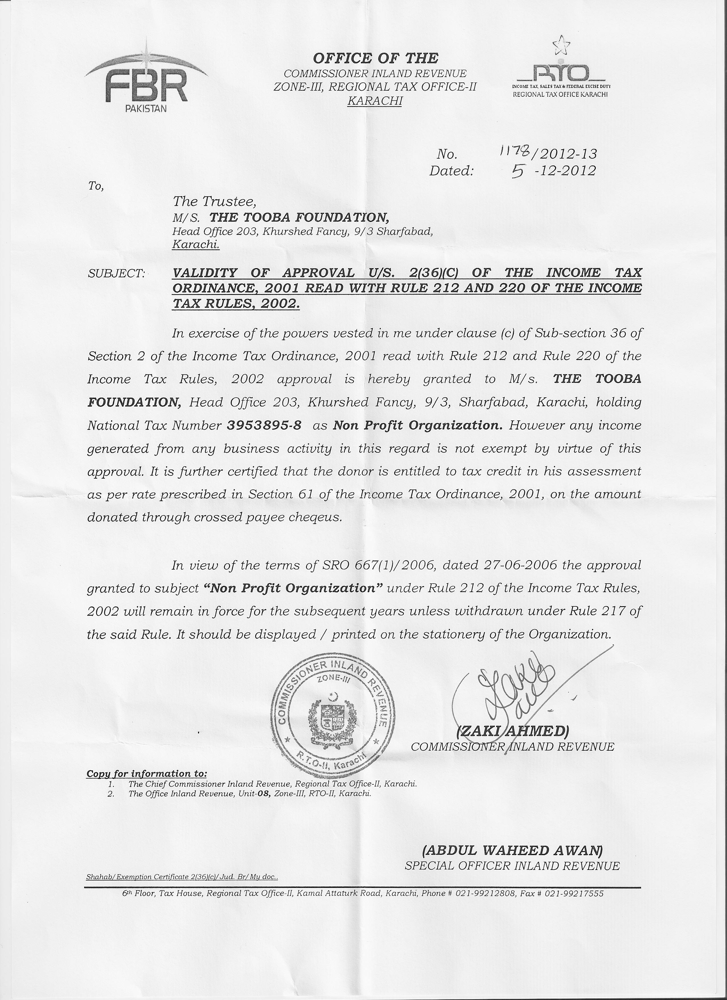


    Image #1:
    Origin: file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/adv3.jpeg
    Resolution: 72 dpi
    Width: 1600 px
    Height: 2100 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


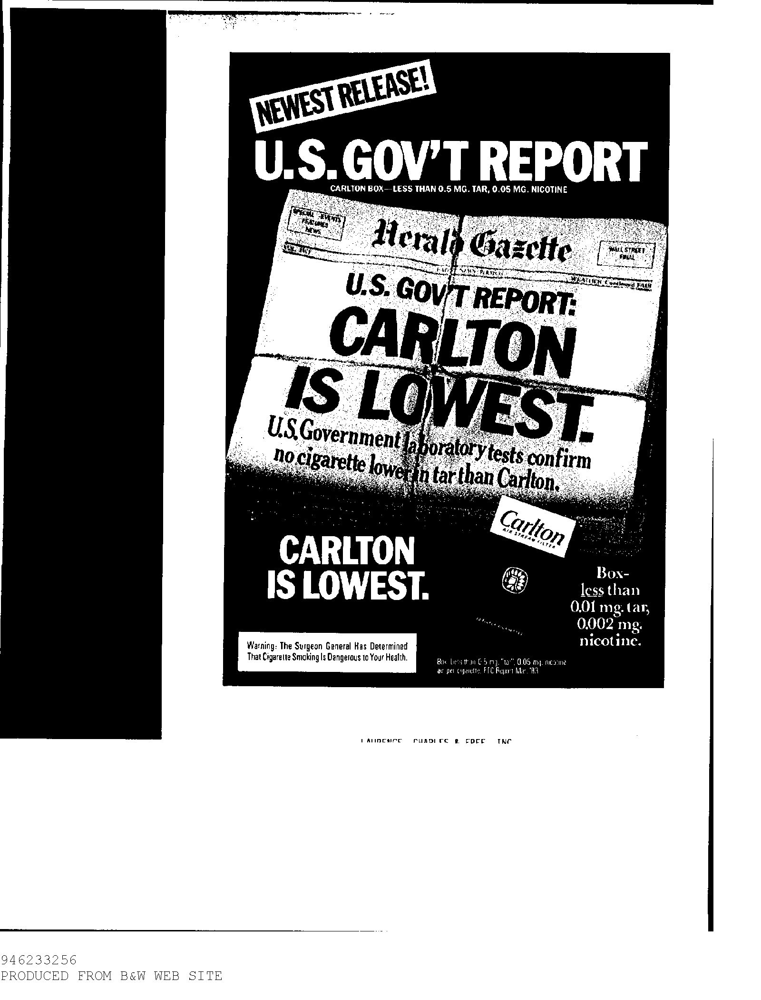


    Image #2:
    Origin: file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/dicom1.jpeg
    Resolution: 96 dpi
    Width: 914 px
    Height: 985 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


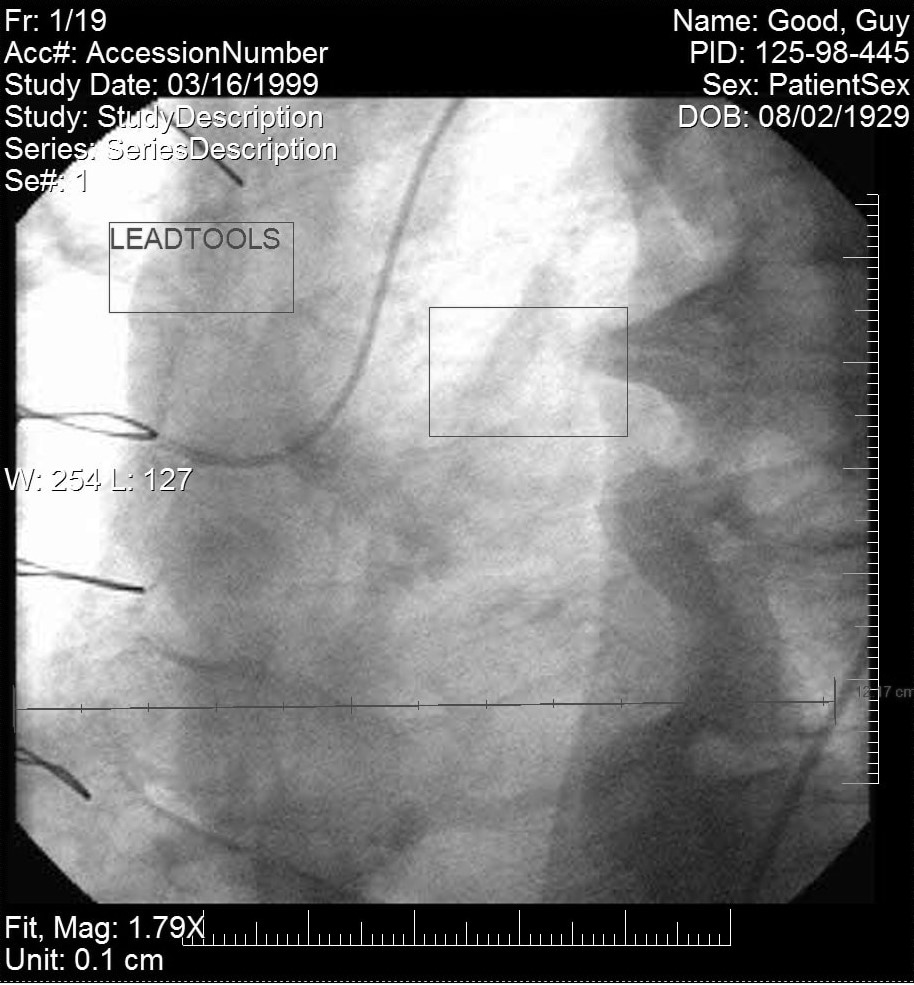


    Image #3:
    Origin: file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/adv1.jpeg
    Resolution: 72 dpi
    Width: 1200 px
    Height: 1575 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


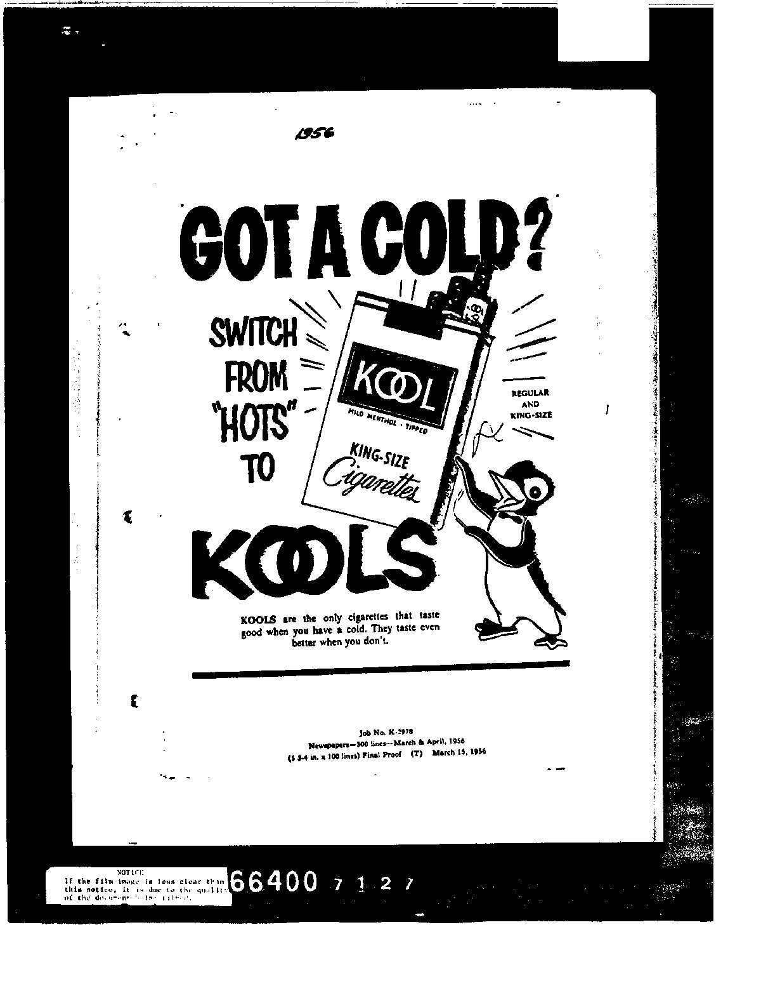


    Image #4:
    Origin: file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/table3.png
    Resolution: 72 dpi
    Width: 628 px
    Height: 335 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


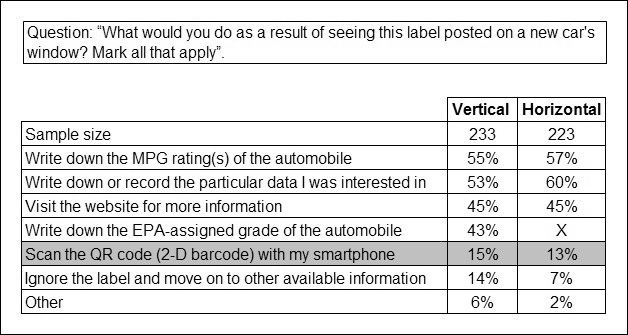

In [13]:
import pkg_resources
examples = "./images_clustering/images_clustering/"
df = spark.read.format("binaryFile").load(examples).cache()
display_images(BinaryToImage().transform(df))

## Call pipeline for compute features

In [14]:
df.printSchema()
df.show(2, truncate=False)

root
 |-- path: string (nullable = true)
 |-- modificationTime: timestamp (nullable = true)
 |-- length: long (nullable = true)
 |-- content: binary (nullable = true)



IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [15]:
features = pipeline.fit(df).transform(df).cache()

## Elbow method to find the optimal  k

We will be using a knee point detection algorithm in order to automatically find the "elbow" which likely corresponds to the optimal value of k.

26/03/30 12:19:01 WARN Instrumentation: [c5c707e6] Input vectors will be blockified to blocks, and then cached during training. Be careful of double caching!
26/03/30 12:19:02 WARN Instrumentation: [2241516f] Input vectors will be blockified to blocks, and then cached during training. Be careful of double caching!
26/03/30 12:19:02 WARN Instrumentation: [8048d714] Input vectors will be blockified to blocks, and then cached during training. Be careful of double caching!


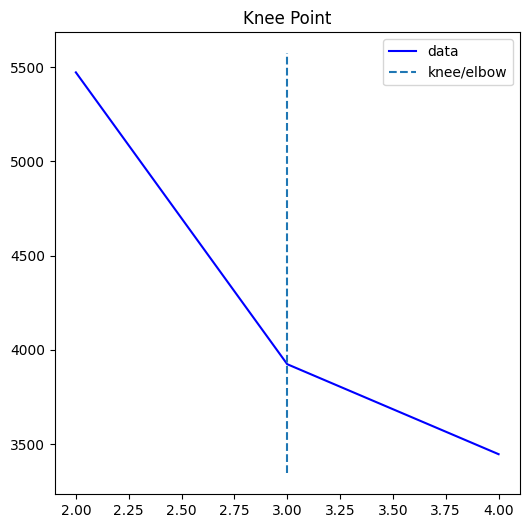

In [35]:
k_max = 5
ks_to_test = range(2, k_max)

distortions = []

for k in ks_to_test:
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol('pcaFeatures')
    model = kmeans.fit(features)
    distortions.append(model.summary.trainingCost)


kneedle = KneeLocator(ks_to_test, distortions, curve="convex", direction="decreasing", S=0.1, online=True)

kneedle.plot_knee(figsize=(6,6))

k = kneedle.elbow

# Training a final model with the ideal  k

In [36]:
kmeans = KMeans(featuresCol='pcaFeatures', k=k)
model = kmeans.fit(features)

predicitions = model.transform(features)

26/03/30 12:19:03 WARN Instrumentation: [1587142b] Input vectors will be blockified to blocks, and then cached during training. Be careful of double caching!


In [37]:
predicitions.select("path", "prediction").show(truncate=False)

+-----------------------------------------------------------------------------------------------------------------+----------+
|path                                                                                                             |prediction|
+-----------------------------------------------------------------------------------------------------------------+----------+
|file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/document_with_signature1.png|0         |
|file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/adv3.jpeg                   |0         |
|file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/dicom1.jpeg                 |1         |
|file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/adv1.jpeg                   |0         |
|file:/home/ubuntu/notebooks/test-examples/visual/images_clustering/images_clustering/table3.png               

In [38]:
predicitions.groupBy("prediction").count().orderBy("prediction").toPandas()

,prediction,count
0,0,6
1,1,2
2,2,2
